# Постановка задачи:

Требуется анализировать данные ЭКГ и разработать способ определения аритмии.
Массив данных представляет из себя из себя отрезок измерений за ~600 секунд, эти данные были выбраны с 64-х электродов. Измерения проводились раз в миллисекунду, а напряжения с электродов измерялись в микровольтах.

Импортируем необходимые модули:

In [2]:
# system imports
import os
import sys

# data science
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import seaborn as sns

# signal processing
from scipy import signal
from scipy.ndimage import label
from scipy.stats import zscore
from scipy.interpolate import interp1d
from scipy.integrate import trapz
from scipy.signal import find_peaks

# misc
import warnings


In [3]:
# style settings
sns.set(style='whitegrid', rc={'axes.facecolor': '#EFF2F7'})

# sample frequency for ECG sensor
settings = {}
settings['fs'] = 500


## Загружаем данные и знакомимся с dataset-ом

In [4]:
frames = []

time_data = np.arange(0, 579.300, 0.001)
time_df = pl.LazyFrame(time_data, schema={"X": pl.Float64})
time_df.explain()
frames.append(time_df)


In [5]:
y_file_path = "new_data_y/"

files_y = os.listdir(y_file_path)

print("Количество файлов:", len(files_y))
# Loop through each pair of X and Y files
for i in range(len(files_y)):  # num_files is the total number of file pairs
    # Load the timestamps and signal strengths into separate lists
    col_name = files_y[i].lstrip("Y ").rstrip(".txt")
    print(col_name, end=" ")
    data = {
        col_name: []
    }

    with open(y_file_path + files_y[i]) as file_y:
        counter = 0
        sum = 0
        for line in file_y:
            if line != "\n":
                sum += float(line.rstrip('\n'))
            else:
                break
            counter += 1
            if (counter == 5):
                data[col_name].append(sum / 5)
                counter = 0
                sum = 0
        file_y.close()

    df = pl.LazyFrame(data, schema={col_name: pl.Float64})
    frames.append(df)


Количество файлов: 64
A1 A2 A3 A6 A7 A8 B1 B2 B3 B6 B7 B8 C1 C2 C3 C4 C5 C6 C7 C8 D1 D2 D3 D4 D5 D6 D7 D8 E1 E2 E3 E4 E5 E6 E7 E8 F1 F2 F3 F4 F5 F6 F7 F8 G1 G2 G3 G4 G5 G6 G7 G8 H2 H3 H4 H5 H6 H7 J2 J3 J4 J5 J6 J7 

In [6]:
frames = pl.collect_all(frames)


In [7]:
df = pl.DataFrame()

for f in frames:
    df = pl.concat([df, f], how="horizontal")

df


X,A1,A2,A3,A6,A7,A8,B1,B2,B3,B6,B7,B8,C1,C2,C3,C4,C5,C6,C7,C8,D1,D2,D3,D4,D5,D6,D7,D8,E1,E2,E3,E4,E5,E6,E7,E8,F1,F2,F3,F4,F5,F6,F7,F8,G1,G2,G3,G4,G5,G6,G7,G8,H2,H3,H4,H5,H6,H7,J2,J3,J4,J5,J6,J7
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.0,1842.0,-185.0,-126.0,-141.5,366.5,1808.0,930.0,-226.0,-204.5,109.5,1794.0,2002.5,2126.0,863.0,12.0,24.5,1072.0,334.0,1699.0,1945.0,8059.0,451.0,-291.0,-294.0,246.0,7.0,2776.5,37.5,5442.5,-105.0,133.5,-132.0,447.5,337.0,2710.5,6.0,2960.0,-789.0,511.5,-274.5,202.5,126.0,2587.0,2304.5,2703.5,707.5,-531.5,38.5,379.0,389.5,2814.0,2170.5,723.5,-307.5,25.0,-812.0,316.0,1573.0,237.5,-216.0,-6.0,158.5,124.0,2526.5
0.001,1389.0,-503.0,-125.0,-312.0,-77.0,1317.0,550.0,-531.0,-226.0,-90.0,1376.5,1517.5,1676.0,505.5,-21.0,-12.5,746.0,152.0,1231.5,1453.5,7605.0,20.0,-341.0,-286.0,113.0,-190.0,2339.0,35.5,4999.5,-577.5,118.5,-108.0,257.0,136.0,2243.0,1.0,2476.5,-1233.0,559.0,-261.0,56.5,-124.0,2111.0,1832.0,2516.0,230.5,-792.5,58.5,217.0,48.5,2337.5,1730.5,250.0,-366.0,40.5,-995.5,21.5,1096.0,-207.5,-229.0,17.0,8.5,-141.0,2042.0
0.002,1111.5,-694.0,-110.0,-270.0,-271.0,1096.0,251.0,-734.0,-217.5,-50.5,1183.5,1270.5,1367.0,247.5,8.5,21.0,881.0,191.5,1005.5,1222.0,7197.5,-238.0,-353.5,-295.0,182.0,-170.0,2131.0,37.0,4692.5,-874.0,150.0,-47.5,355.5,141.0,2010.5,2.5,2205.0,-1530.0,628.5,-250.5,49.0,-140.0,1881.5,1601.0,2399.5,-38.5,-893.5,81.0,277.5,-62.0,2097.5,1531.0,-71.5,-285.5,72.0,-916.0,-42.0,854.0,-518.5,-174.0,29.0,83.5,-168.0,1813.5
0.003,978.5,-792.0,-89.0,-314.5,-442.5,884.0,160.0,-787.5,-192.5,-58.5,992.0,1078.0,1180.0,152.0,24.5,8.5,679.0,161.5,825.5,1020.5,6974.0,-377.0,-349.0,-300.5,98.0,-197.0,1945.0,36.5,4489.5,-982.0,183.5,-37.0,231.5,110.0,1809.0,4.5,1922.0,-1664.5,596.5,-240.0,34.5,-198.5,1688.0,1425.0,2139.0,-166.0,-909.5,120.5,188.5,-192.5,1909.0,1369.0,-176.0,-317.5,89.5,-1047.0,-133.5,677.0,-635.0,-182.0,64.0,-17.5,-220.5,1622.0
0.004,850.0,-907.0,-79.5,-167.0,-479.0,803.0,2.5,-912.0,-195.0,29.0,950.0,1010.5,1018.5,-26.5,18.0,15.5,1058.5,286.5,766.0,946.0,6724.0,-569.5,-364.5,-332.5,257.5,-95.5,1871.0,36.5,4290.5,-1134.0,179.5,-41.5,466.0,199.0,1748.5,4.0,1776.0,-1813.5,652.5,-227.5,183.5,-124.5,1614.5,1365.5,2227.5,-338.5,-939.5,122.5,368.0,-179.0,1843.0,1307.0,-320.5,-233.0,99.5,-836.0,-94.0,612.0,-792.0,-118.0,74.5,146.0,-148.0,1549.5
0.005,660.0,-1013.5,-98.5,-94.0,-599.5,655.0,-194.5,-975.5,-200.5,111.5,834.5,871.0,843.5,-134.0,11.0,28.0,1249.5,366.5,635.0,825.0,6533.5,-659.5,-400.0,-341.5,328.0,-35.0,1745.5,34.0,4103.5,-1322.0,185.0,-32.0,583.5,264.5,1603.5,2.0,1718.0,-2001.0,554.5,-244.5,240.5,-112.5,1483.5,1247.0,2048.5,-550.0,-999.0,108.5,447.5,-236.5,1700.0,1211.0,-501.5,-340.5,85.5,-731.5,-75.5,470.5,-966.0,-224.0,101.5,227.5,-105.5,1417.5
0.006,518.5,-1195.5,-60.0,-27.5,-723.5,507.0,-349.0,-1095.5,-180.5,197.0,714.5,714.0,703.0,-264.0,39.0,27.0,1386.5,430.0,489.5,659.0,6403.0,-794.0,-396.5,-341.0,380.5,26.5,1599.0,36.5,3920.0,-1417.5,217.0,-23.0,657.0,303.5,1441.0,3.5,1511.0,-2105.5,531.0,-204.0,316.0,-94.0,1321.0,1118.0,1832.0,-693.5,-1102.0,145.5,518.0,-302.5,1549.0,1081.5,-633.5,-360.0,132.0,-673.0,-125.5,327.5,-1102.0,-263.0,121.0,276.0,-104.0,1258.5
0.007,16.0,-1540.0,-84.5,-137.0,-1228.5,-48.0,-808.5,-1523.0,-206.5,55.5,249.0,174.5,206.0,-707.0,17.0,28.0,1240.5,308.5,-28.5,131.5,5908.5,-1244.0,-412.0,-362.0,315.0,-122.0,1099.5,38.5,3387.5,-1885.5,154.5,-25.5,560.5,129.5,897.0,3.0,1100.0,-2584.0,510.5,-229.0,201.0,-332.5,773.5,590.5,1726.0,-1138.0,-1376.0,134.5,428.5,-669.0,1006.5,563.0,-1116.5,-422.5,130.5,-766.0,-448.0,-233.0,-1581.0,-304.5,129.5,203.5,-377.0,690.5
0.008,99.0,-1450.5,-58.0,-125.5,-1120.5,73.0,-756.5,-1454.0,-202.0,169.5,308.5,293.0,308.5,-574.0,31.0,38.0,1231.5,397.0,78.0,235.0,6026.5,-1138.0,-387.5,-391.0,321.0,-20.0,1168.5,37.0,3473.0

Познакомимся с данными. Выводим первые 10 строк dataset-а:

In [8]:
df.head(10)


X,A1,A2,A3,A6,A7,A8,B1,B2,B3,B6,B7,B8,C1,C2,C3,C4,C5,C6,C7,C8,D1,D2,D3,D4,D5,D6,D7,D8,E1,E2,E3,E4,E5,E6,E7,E8,F1,F2,F3,F4,F5,F6,F7,F8,G1,G2,G3,G4,G5,G6,G7,G8,H2,H3,H4,H5,H6,H7,J2,J3,J4,J5,J6,J7
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.0,1842.0,-185.0,-126.0,-141.5,366.5,1808.0,930.0,-226.0,-204.5,109.5,1794.0,2002.5,2126.0,863.0,12.0,24.5,1072.0,334.0,1699.0,1945.0,8059.0,451.0,-291.0,-294.0,246.0,7.0,2776.5,37.5,5442.5,-105.0,133.5,-132.0,447.5,337.0,2710.5,6.0,2960.0,-789.0,511.5,-274.5,202.5,126.0,2587.0,2304.5,2703.5,707.5,-531.5,38.5,379.0,389.5,2814.0,2170.5,723.5,-307.5,25.0,-812.0,316.0,1573.0,237.5,-216.0,-6.0,158.5,124.0,2526.5
0.001,1389.0,-503.0,-125.0,-312.0,-77.0,1317.0,550.0,-531.0,-226.0,-90.0,1376.5,1517.5,1676.0,505.5,-21.0,-12.5,746.0,152.0,1231.5,1453.5,7605.0,20.0,-341.0,-286.0,113.0,-190.0,2339.0,35.5,4999.5,-577.5,118.5,-108.0,257.0,136.0,2243.0,1.0,2476.5,-1233.0,559.0,-261.0,56.5,-124.0,2111.0,1832.0,2516.0,230.5,-792.5,58.5,217.0,48.5,2337.5,1730.5,250.0,-366.0,40.5,-995.5,21.5,1096.0,-207.5,-229.0,17.0,8.5,-141.0,2042.0
0.002,1111.5,-694.0,-110.0,-270.0,-271.0,1096.0,251.0,-734.0,-217.5,-50.5,1183.5,1270.5,1367.0,247.5,8.5,21.0,881.0,191.5,1005.5,1222.0,7197.5,-238.0,-353.5,-295.0,182.0,-170.0,2131.0,37.0,4692.5,-874.0,150.0,-47.5,355.5,141.0,2010.5,2.5,2205.0,-1530.0,628.5,-250.5,49.0,-140.0,1881.5,1601.0,2399.5,-38.5,-893.5,81.0,277.5,-62.0,2097.5,1531.0,-71.5,-285.5,72.0,-916.0,-42.0,854.0,-518.5,-174.0,29.0,83.5,-168.0,1813.5
0.003,978.5,-792.0,-89.0,-314.5,-442.5,884.0,160.0,-787.5,-192.5,-58.5,992.0,1078.0,1180.0,152.0,24.5,8.5,679.0,161.5,825.5,1020.5,6974.0,-377.0,-349.0,-300.5,98.0,-197.0,1945.0,36.5,4489.5,-982.0,183.5,-37.0,231.5,110.0,1809.0,4.5,1922.0,-1664.5,596.5,-240.0,34.5,-198.5,1688.0,1425.0,2139.0,-166.0,-909.5,120.5,188.5,-192.5,1909.0,1369.0,-176.0,-317.5,89.5,-1047.0,-133.5,677.0,-635.0,-182.0,64.0,-17.5,-220.5,1622.0
0.004,850.0,-907.0,-79.5,-167.0,-479.0,803.0,2.5,-912.0,-195.0,29.0,950.0,1010.5,1018.5,-26.5,18.0,15.5,1058.5,286.5,766.0,946.0,6724.0,-569.5,-364.5,-332.5,257.5,-95.5,1871.0,36.5,4290.5,-1134.0,179.5,-41.5,466.0,199.0,1748.5,4.0,1776.0,-1813.5,652.5,-227.5,183.5,-124.5,1614.5,1365.5,2227.5,-338.5,-939.5,122.5,368.0,-179.0,1843.0,1307.0,-320.5,-233.0,99.5,-836.0,-94.0,612.0,-792.0,-118.0,74.5,146.0,-148.0,1549.5
0.005,660.0,-1013.5,-98.5,-94.0,-599.5,655.0,-194.5,-975.5,-200.5,111.5,834.5,871.0,843.5,-134.0,11.0,28.0,1249.5,366.5,635.0,825.0,6533.5,-659.5,-400.0,-341.5,328.0,-35.0,1745.5,34.0,4103.5,-1322.0,185.0,-32.0,583.5,264.5,1603.5,2.0,1718.0,-2001.0,554.5,-244.5,240.5,-112.5,1483.5,1247.0,2048.5,-550.0,-999.0,108.5,447.5,-236.5,1700.0,1211.0,-501.5,-340.5,85.5,-731.5,-75.5,470.5,-966.0,-224.0,101.5,227.5,-105.5,1417.5
0.006,518.5,-1195.5,-60.0,-27.5,-723.5,507.0,-349.0,-1095.5,-180.5,197.0,714.5,714.0,703.0,-264.0,39.0,27.0,1386.5,430.0,489.5,659.0,6403.0,-794.0,-396.5,-341.0,380.5,26.5,1599.0,36.5,3920.0,-1417.5,217.0,-23.0,657.0,303.5,1441.0,3.5,1511.0,-2105.5,531.0,-204.0,316.0,-94.0,1321.0,1118.0,1832.0,-693.5,-1102.0,145.5,518.0,-302.5,1549.0,1081.5,-633.5,-360.0,132.0,-673.0,-125.5,327.5,-1102.0,-263.0,121.0,276.0,-104.0,1258.5
0.007,16.0,-1540.0,-84.5,-137.0,-1228.5,-48.0,-808.5,-1523.0,-206.5,55.5,249.0,174.5,206.0,-707.0,17.0,28.0,1240.5,308.5,-28.5,131.5,5908.5,-1244.0,-412.0,-362.0,315.0,-122.0,1099.5,38.5,3387.5,-1885.5,154.5,-25.5,560.5,129.5,897.0,3.0,1100.0,-2584.0,510.5,-229.0,201.0,-332.5,773.5,590.5,1726.0,-1138.0,-1376.0,134.5,428.5,-669.0,1006.5,563.0,-1116.5,-422.5,130.5,-766.0,-448.0,-233.0,-1581.0,-304.5,129.5,203.5,-377.0,690.5
0.008,99.0,-1450.5,-58.0,-125.5,-1120.5,73.0,-756.5,-1454.0,-202.0,169.5,308.5,293.0,308.5,-574.0,31.0,38.0,1231.5,397.0,78.0,235.0,6026.5,-1138.0,-387.5,-391.0,321.0,-20.0,1168.5,37.0,3473.0

Выводим последние 10 строк dataset-а:

In [9]:
df.tail(10)


X,A1,A2,A3,A6,A7,A8,B1,B2,B3,B6,B7,B8,C1,C2,C3,C4,C5,C6,C7,C8,D1,D2,D3,D4,D5,D6,D7,D8,E1,E2,E3,E4,E5,E6,E7,E8,F1,F2,F3,F4,F5,F6,F7,F8,G1,G2,G3,G4,G5,G6,G7,G8,H2,H3,H4,H5,H6,H7,J2,J3,J4,J5,J6,J7
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
579.29,-340.0,511.0,462.5,-294.5,-406.0,-43.5,-352.5,394.0,569.5,-227.5,-867.5,183.5,-359.0,565.0,304.0,286.5,-301.0,-24.0,260.5,397.0,380.5,724.0,763.0,518.0,256.5,-413.0,-949.0,34.5,561.0,1123.5,464.5,162.0,-88.0,-191.0,-113.0,-1.5,1236.5,1206.0,-812.5,627.0,-189.0,-243.0,239.5,-365.5,705.5,24.5,250.5,288.0,-18.0,205.0,463.0,-515.5,738.5,377.0,409.0,-78.5,348.0,593.5,2667.5,116.5,273.0,-49.0,-111.0,587.0
579.291,-390.0,482.0,442.5,-228.0,-337.0,21.0,-440.5,359.0,550.0,-170.0,-810.0,240.5,-394.0,596.5,287.5,274.0,-187.0,14.5,312.5,469.5,220.0,683.5,743.0,507.0,298.0,-366.0,-890.5,36.0,574.5,1149.5,450.5,149.0,-28.0,-157.0,-54.0,-2.0,1243.0,1259.5,-997.5,603.0,-90.5,-218.0,272.0,-324.0,1049.5,63.5,257.0,255.0,37.5,241.5,513.5,-479.0,756.0,323.5,396.5,-34.0,383.0,653.5,2719.0,61.5,304.5,-13.0,-71.5,633.5
579.292,-473.0,453.0,461.0,-185.0,-320.0,34.5,-517.0,365.5,553.0,-125.5,-785.0,255.0,-410.0,569.5,303.0,284.0,-103.0,84.0,319.0,501.5,214.0,675.0,766.5,518.0,325.5,-310.5,-885.0,35.5,583.5,1084.0,472.0,200.0,27.5,-111.0,-57.0,0.5,885.5,1176.5,-1022.0,616.5,-35.0,-189.5,274.0,-326.0,1056.0,-15.0,240.5,266.5,80.5,281.0,500.5,-484.0,693.5,319.0,387.5,16.0,405.5,657.5,2669.5,54.5,314.5,26.0,-37.5,635.0
579.293,-213.5,714.5,482.0,-225.5,-120.0,260.0,-134.0,606.0,609.0,-147.5,-628.0,477.0,-104.0,860.0,345.0,285.0,-228.0,69.0,531.5,750.0,396.5,945.0,788.5,475.0,275.5,-306.0,-700.5,35.5,852.0,1375.0,477.0,212.0,-51.0,-77.0,175.5,-1.5,1169.5,1520.5,-821.5,639.0,-75.5,-115.5,508.0,-110.5,761.5,298.5,461.5,283.0,32.0,400.0,731.5,-253.5,930.5,459.5,394.5,-44.5,515.0,887.0,2994.5,177.5,323.5,-22.5,43.5,855.0
579.294,-309.5,602.0,458.0,-81.5,-144.5,235.0,-140.5,466.5,561.5,-21.5,-597.0,456.5,-283.0,731.0,315.0,288.5,141.5,185.5,503.5,728.5,439.5,823.5,767.0,487.0,432.0,-211.5,-697.0,35.0,681.5,1371.0,434.0,214.0,168.0,-5.5,156.5,-1.0,1219.0,1518.5,-899.0,628.0,52.5,-70.0,468.5,-151.0,648.5,230.5,323.5,256.5,196.5,428.0,690.0,-298.5,843.0,391.5,390.0,143.0,549.0,860.5,2880.0,106.0,319.5,148.5,90.5,821.5
579.295,-501.5,443.0,460.0,-13.0,-191.5,180.0,-247.5,325.0,544.5,31.0,-629.5,404.0,-449.5,572.0,284.5,283.5,264.5,242.0,447.5,712.5,221.0,639.0,747.0,507.0,478.5,-168.5,-728.0,34.0,515.5,1224.5,427.0,217.5,241.5,22.0,89.0,-4.0,977.5,1352.0,-936.0,611.5,141.0,-83.0,409.5,-214.5,656.0,66.0,212.5,256.0,258.5,424.5,629.5,-360.5,719.5,338.5,385.0,208.0,558.0,803.0,2685.0,69.5,322.0,192.5,82.0,752.5
579.296,-548.0,381.5,403.5,-16.0,-203.5,161.5,-459.5,262.0,484.5,17.0,-649.5,377.5,-544.5,444.5,226.0,257.0,277.0,236.0,427.5,695.0,168.0,540.0,671.0,405.0,472.5,-163.5,-763.5,33.0,416.0,1029.0,344.0,164.0,246.5,24.0,62.0,-2.0,1035.5,1184.0,-1116.0,541.5,128.5,-95.0,366.5,-230.5,703.0,-40.0,119.0,196.5,256.5,416.5,599.0,-394.5,645.0,247.5,354.0,224.5,555.0,777.5,2566.0,-31.5,241.5,193.0,75.5,717.0
579.297,-456.0,443.0,497.5,146.5,-16.5,334.0,-219.0,294.0,576.0,185.5,-480.0,588.0,-469.0,495.5,334.0,281.5,643.0,410.5,617.0,917.0,218.5,603.5,768.0,460.0,629.5,-3.0,-570.0,35.0,496.5,1117.5,423.5,208.0,453.0,191.5,254.0,-1.0,893.5,1205.0,-950.0,634.0,296.0,85.0,556.5,-44.5,609.5,24.5,194.5,282.5,440.5,594.0,787.5,-214.0,679.0,338.5,399.5,421.0,719.0,979.0,2612.5,47.5,334.5,363.5,236.5,900.0
579.298,-454.0,488.0,484.5,166.5,61.0,445.0,-238.0,352.5,565.5,222.0,-406.0,655.0,-424.5,566.5,315.0,285.0,572.5,427.0,689.5,1022.5,290.0,652.5,752.5,489.0,591.0,26.0,-499.5,35.0,528.5,1179.0,432.5,210.5,394.5,228.5,329.5,0.0,976.5,1254.5,-831.0,629.0,325.5,120.0,634.0,25.0,620.0,50.5,253.0,260.0,417.0,649.5,856.5,-141.0,720.5,

## Анализ длин интервалов RR и значений напряжений пиков R

Обычно на ЭКГ можно выделить 5 зубцов: P, Q, R, S, T. Иногда можно увидеть малозаметную волну U. Зубец P отображает процесс деполяризации миокарда предсердий, комплекс QRS — деполяризации желудочков, сегмент ST и зубец T отражают процессы реполяризации миокарда желудочков. <br/>
Искать аритмию будем по зубцу <b>R</b> и интервалу <b>R-R</b>. Правильный ритм - <b>одинаковые R-R±10% от среднего R-R, соседние R-R отличаются менее, чем на 0,12с</b>.

<img src="ecg-complex-rus.jpg">

Представим данные со всех 64-х электродов в виде графиков, чтобы выбрать самый стабильный сигнал:

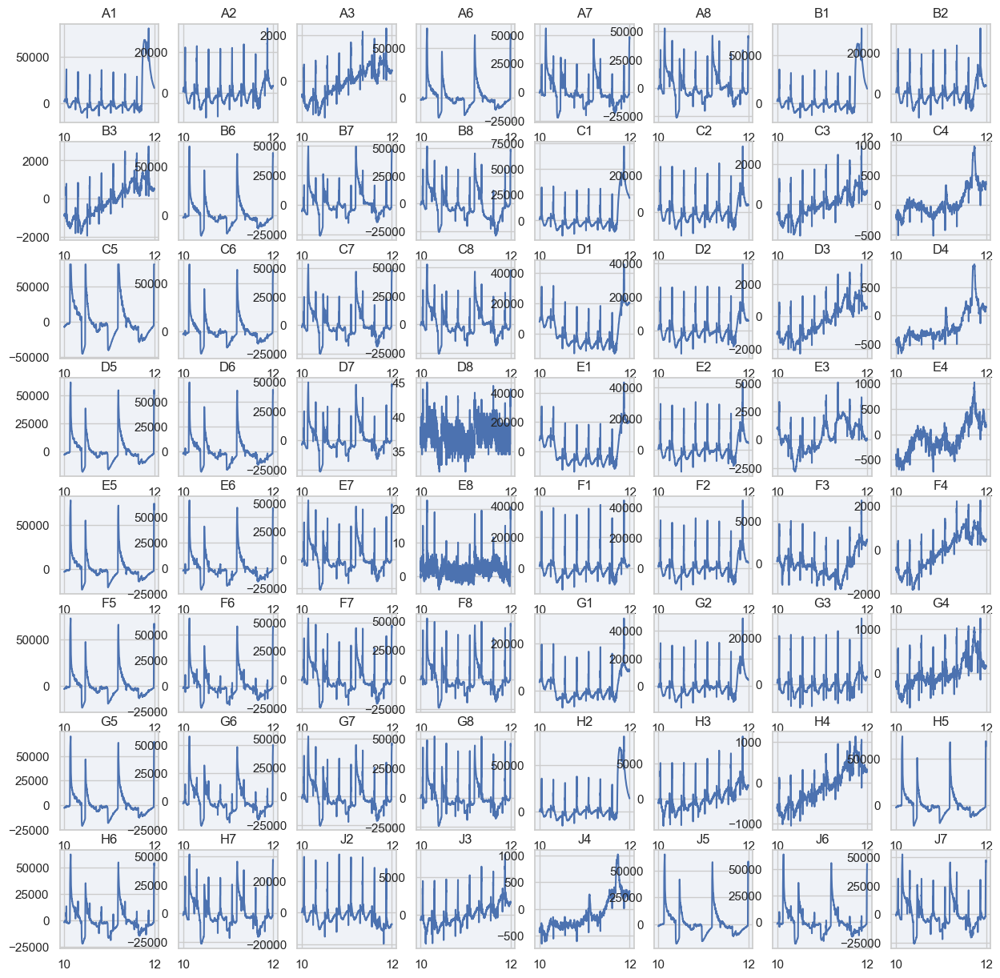

In [10]:
# Create four polar axes and access them through the returned array
fig, axs = plt.subplots(8, 8, figsize=(15, 15))
start = 10000
stop = 12000
cols = df.columns
for i in range(8):
    for j in range(8):
        x = np.array(df["X"].slice(start, stop - start))
        y = np.array(df[cols[i * 8 + j + 1]].slice(start, stop - start))
        axs[i, j].set_title(cols[i * 8 + j + 1])
        axs[i, j].plot(x, y)

plt.show()


В дальнейшем будем работать с данными с электрода B2.

In [76]:
selected_col = "B2"
start = 15000
stop = 25000


## Фильтрация сигнала

Данный код является вспомогательным для обнаружения пиков на отдельных участках графика.

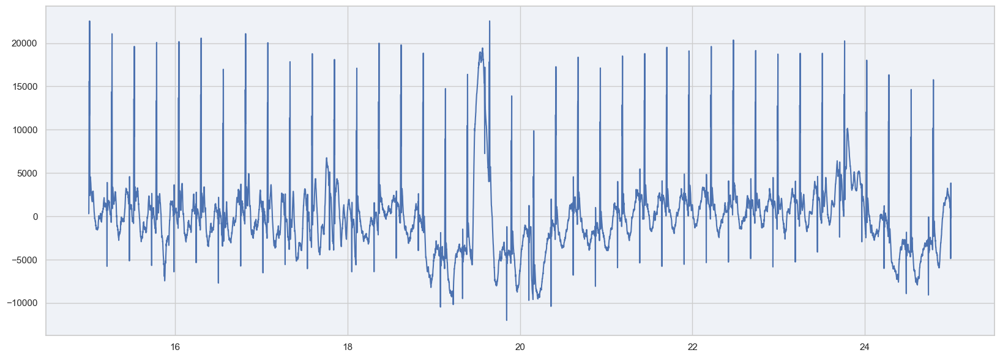

In [96]:
x = np.array(df["X"].slice(start, stop - start))
y = np.array(df[selected_col].slice(start, stop - start))

plt.figure(figsize=(20, 7))
plt.plot(x, y)
plt.show()


In [97]:
from scipy.signal import butter, filtfilt

# define the filter parameters
cutoff_freq = 70  # Hz
order = 4

sampling_rate = 1000

# create the filter coefficients
# sampling_rate is the sampling rate of the ECG data
nyquist_freq = 0.5 * sampling_rate
cutoff = cutoff_freq / nyquist_freq
b, a = butter(order, cutoff, btype='low')

# apply the filter to the voltage data
filtered_voltage_data = filtfilt(b, a, df[selected_col])

filtered_df = pl.DataFrame(df["X"])
filtered_df = pl.concat([filtered_df, pl.DataFrame(
    filtered_voltage_data, schema={selected_col: pl.Float64})], how="horizontal")


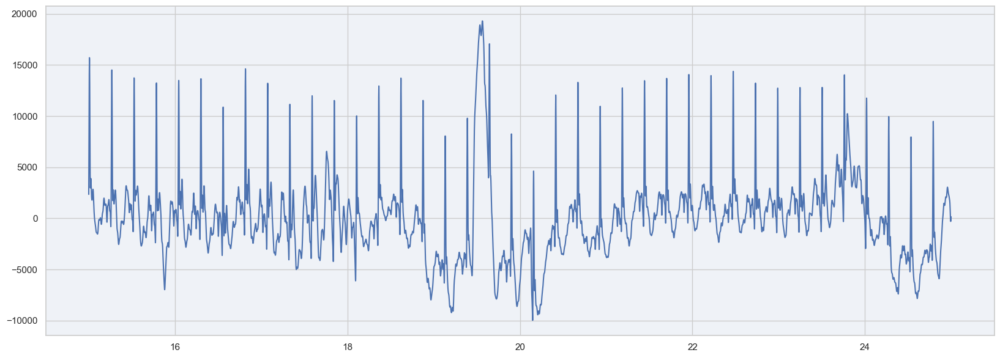

In [98]:
x = np.array(filtered_df["X"].slice(start, stop - start))
y = np.array(filtered_df[selected_col].slice(start, stop - start))

plt.figure(figsize=(20, 7))
plt.plot(x, y)
plt.show()


## Поиск интервалов RR на отрезке

Функция обнаружения пиков

In [99]:
def detect_peaks(ecg_signal, threshold=0.3, qrs_filter=None, col="A1"):
    '''
    Peak detection algorithm using cross corrrelation and threshold 
    '''
    if qrs_filter is None:
        # create default qrs filter, which is just a part of the sine function
        t = np.linspace(1.5 * np.pi, 3.5 * np.pi, 15)
        qrs_filter = np.sin(t)

    # normalize data
    data = np.array(ecg_signal[col])
    data = (data - data.mean()) / data.std()

    # calculate cross correlation
    similarity = np.correlate(data, qrs_filter, mode="same")
    similarity = similarity / np.max(similarity)
    # print(ecg_signal.filter())
    # return peaks (values in ms) using threshold
    return ecg_signal.filter(similarity > threshold)["X"], similarity


Вспомогательная функция разбиения на подинтервалы

In [100]:
ecg_slice = filtered_df.slice(start, stop - start)


Text(0, 0.5, 'Similarity (normalized)')

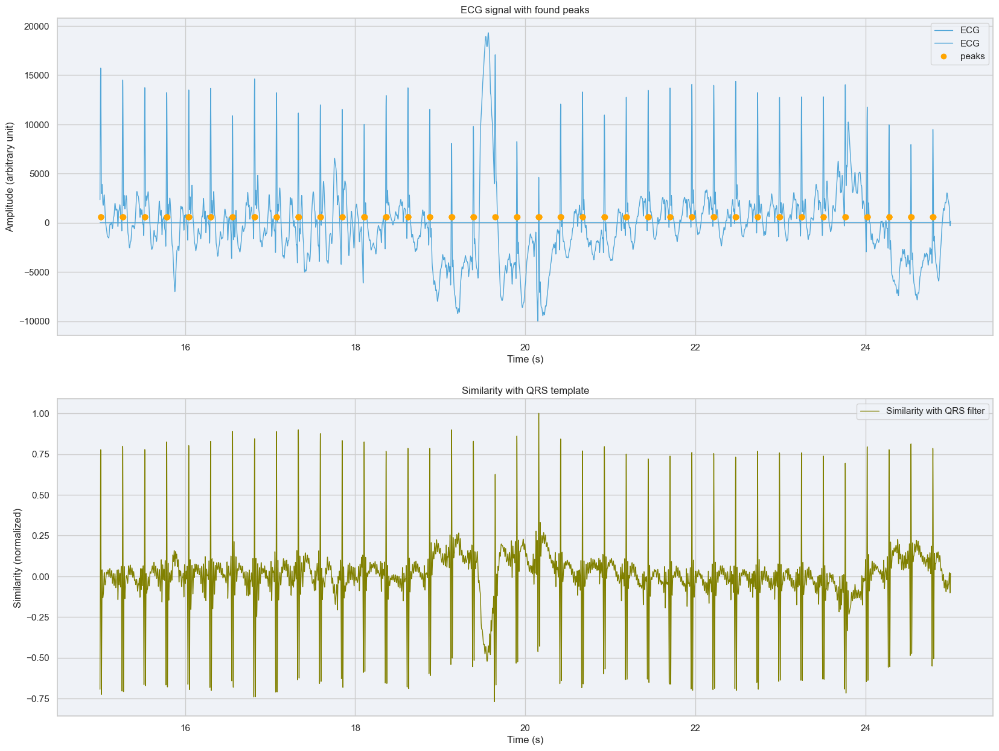

In [101]:
# detect peaks
peaks, similarity = detect_peaks(
    ecg_slice, threshold=0.5, qrs_filter=None, col=selected_col)

# plot similarity
plt.figure(figsize=(20, 15))

plt.subplot(211)
plt.title("ECG signal with found peaks")
plt.plot(ecg_slice["X"], ecg_slice, label="ECG",
         color="#51A6D8", linewidth=1)
plt.plot(peaks, np.repeat(
    600, peaks.shape[0]), label="peaks", color="orange", marker="o", linestyle="None")
plt.legend(loc="upper right")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (arbitrary unit)")

plt.subplot(212)
plt.title('Similarity with QRS template')
plt.plot(ecg_slice["X"], similarity,
         label="Similarity with QRS filter", color="olive", linewidth=1)
plt.legend(loc="upper right")
plt.xlabel("Time (s)")
plt.ylabel("Similarity (normalized)")


Функция для группировки меток пиков, так как один пик обозначен несколькими метками

In [102]:
def group_peaks(p, threshold=1):
    '''
    The peak detection algorithm finds multiple peaks for each QRS complex. 
    Here we group collections of peaks that are very near (within threshold) and we take the median index 
    '''
    # initialize output
    output = np.empty(0)

    # label groups of sample that belong to the same peak
    peak_groups, num_groups = label(np.diff(p) < threshold)

    # iterate through groups and take the mean as peak index
    for i in np.unique(peak_groups)[1:]:
        peak_group = p[np.where(peak_groups == i)]
        output = np.append(output, np.median(peak_group))
    return output


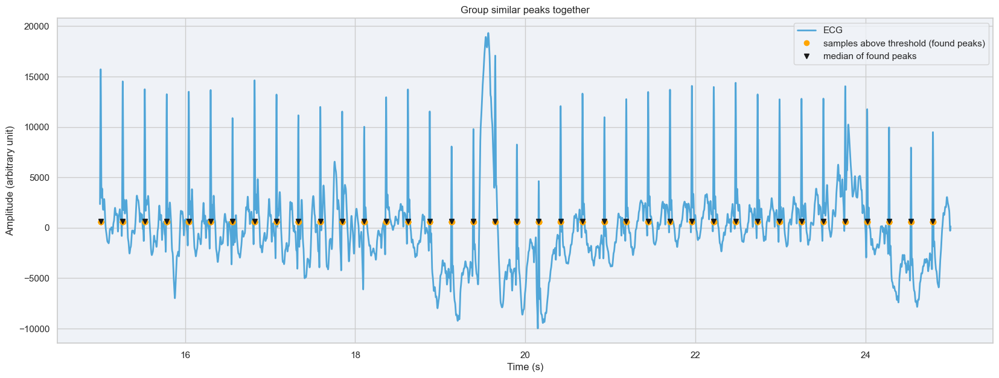

In [103]:
# group peaks
grouped_peaks = group_peaks(np.array(peaks), 0.1)

# plot peaks
plt.figure(figsize=(20, 7))
plt.title("Group similar peaks together")
plt.plot(ecg_slice["X"], ecg_slice[selected_col],
         label="ECG", color="#51A6D8", linewidth=2)
plt.plot(peaks, np.repeat(
    600, peaks.shape[0]), label="samples above threshold (found peaks)", color="orange", marker="o", linestyle="None")
plt.plot(grouped_peaks, np.repeat(
    620, grouped_peaks.shape[0]), label="median of found peaks", color="k", marker="v", linestyle="None")
plt.legend(loc="upper right")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (arbitrary unit)")
plt.show()


[0.259  0.259  0.2585 0.2585 0.2575 0.2575 0.259  0.2575 0.257  0.2585
 0.257  0.2585 0.2575 0.257  0.2565 0.257  0.256  0.2565 0.255  0.257
 0.257  0.257  0.258  0.256  0.258  0.2565 0.2575 0.257  0.2575 0.258
 0.2575 0.259  0.257  0.2575 0.2575 0.257  0.2575 0.2575]


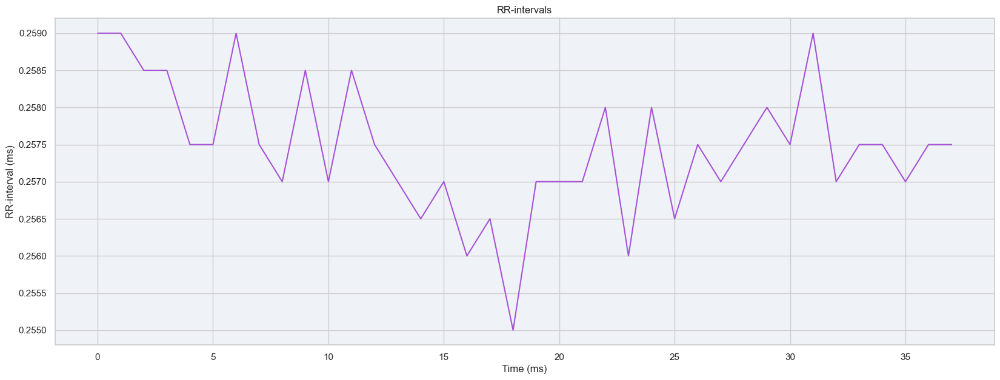

In [104]:
# RR-intervals are the differences between successive peaks
rr = np.diff(grouped_peaks)
print(rr)
# plot RR-intervals
plt.figure(figsize=(20, 7))
plt.title("RR-intervals")
plt.xlabel("Time (ms)")
plt.ylabel("RR-interval (ms)")

plt.plot(rr, label="RR-interval", color="#A651D8")
plt.show()


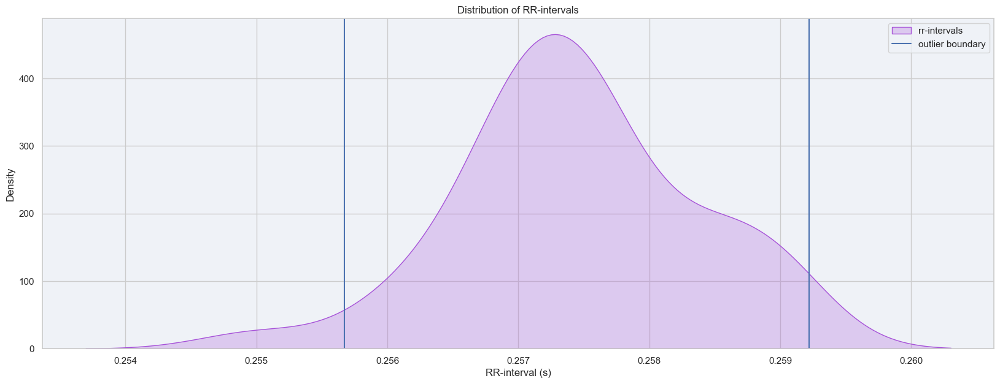

In [105]:
plt.figure(figsize=(20, 7))
plt.title("Distribution of RR-intervals")

with warnings.catch_warnings():
    warnings.simplefilter("ignore")  # ignore FutureWarning
    sns.kdeplot(rr, label="rr-intervals", color="#A651D8", shade=True)

outlier_low = np.mean(rr) - 2 * np.std(rr)
outlier_high = np.mean(rr) + 2 * np.std(rr)

plt.axvline(x=outlier_low)
plt.axvline(x=outlier_high, label="outlier boundary")
# plt.text(outlier_low - 370, 0.004, "outliers low (< mean - 2 sigma)")
# plt.text(outlier_high + 20, 0.004, "outliers high (> mean + 2 sigma)")

plt.xlabel("RR-interval (s)")
plt.ylabel("Density")

plt.legend()
plt.show()


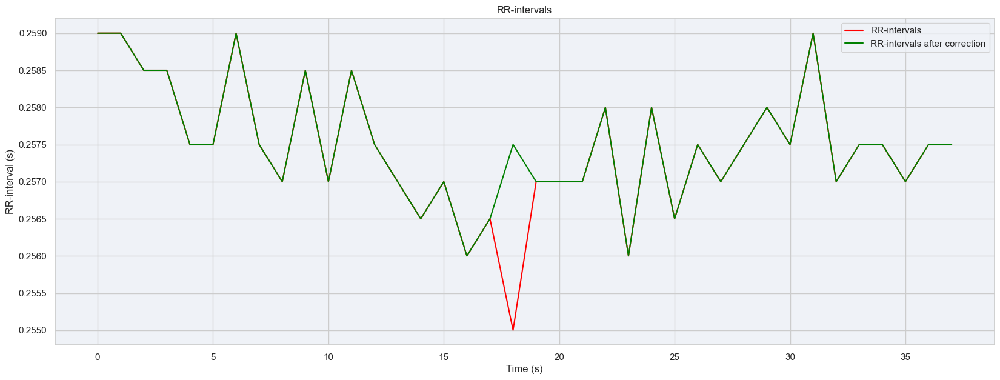

In [106]:
plt.figure(figsize=(20, 7))

rr_corrected = rr.copy()
rr_corrected[np.abs(zscore(rr)) > 2] = np.median(rr)

plt.title("RR-intervals")
plt.xlabel("Time (s)")
plt.ylabel("RR-interval (s)")

plt.plot(rr, color="red", label="RR-intervals")
plt.plot(rr_corrected, color="green",  label="RR-intervals after correction")
plt.legend()
plt.show()


Text(0, 0.5, 'RR-interval (s)')

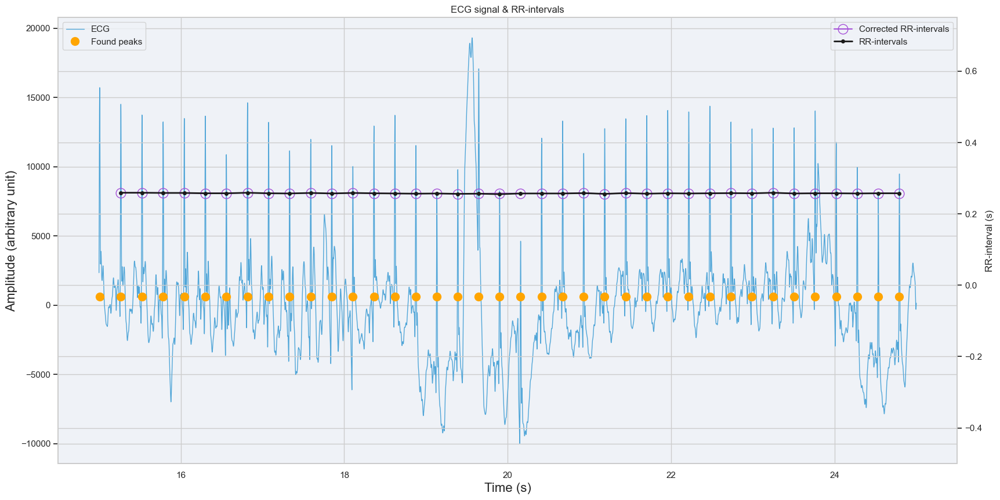

In [107]:
# plot similarity
plt.figure(figsize=(20, 10))

plt.title("ECG signal & RR-intervals")
plt.plot(ecg_slice["X"], ecg_slice[selected_col],
         label="ECG", color="#51A6D8", linewidth=1)
plt.plot(grouped_peaks, np.repeat(
    600, grouped_peaks.shape[0]), markersize=10, label="Found peaks", color="orange", marker="o", linestyle="None")
plt.legend(loc="upper left")
plt.xlabel("Time (s)", fontsize=16)
plt.ylabel("Amplitude (arbitrary unit)", fontsize=16)

ax2 = plt.gca().twinx()
ax2.plot(grouped_peaks[1:], rr_corrected, label="Corrected RR-intervals",
         fillstyle="none", color="#A651D8", markeredgewidth=1, marker="o", markersize=12)
ax2.plot(grouped_peaks[1:], rr, label="RR-intervals",
         color="k", linewidth=2, marker=".", markersize=8)

ax2.set_ylim(-0.5, 0.75)
ax2.legend(loc="upper right")
plt.xlabel("Time (s)")
plt.ylabel("RR-interval (s)")


## Посчитаем все RR-интервалы

Так как алгоритм нахождения пиков лучше всего работает на маленьком интервале, сделаем функцию, которая будет делить все данные на отрезки:

In [121]:
def get_plot_ranges(start=10, end=20, n=5):
    '''
    # Example:
    >> list(get_plot_ranges())
    >> [(0.0, 3.0), (3.0, 6.0), (6.0, 9.0)]

    '''
    distance = end - start
    for i in np.arange(start, end, np.floor(distance/n)):
        yield (int(i), int(np.minimum(end, np.floor(distance/n) + i)))


In [146]:
n_intervals = int((filtered_df.shape[0] - 15000) / (10000)) + 1
n_intervals


57

In [126]:
print(list(get_plot_ranges(0, filtered_df.shape[0], n_intervals)))


[(0, 9987), (9987, 19974), (19974, 29961), (29961, 39948), (39948, 49935), (49935, 59922), (59922, 69909), (69909, 79896), (79896, 89883), (89883, 99870), (99870, 109857), (109857, 119844), (119844, 129831), (129831, 139818), (139818, 149805), (149805, 159792), (159792, 169779), (169779, 179766), (179766, 189753), (189753, 199740), (199740, 209727), (209727, 219714), (219714, 229701), (229701, 239688), (239688, 249675), (249675, 259662), (259662, 269649), (269649, 279636), (279636, 289623), (289623, 299610), (299610, 309597), (309597, 319584), (319584, 329571), (329571, 339558), (339558, 349545), (349545, 359532), (359532, 369519), (369519, 379506), (379506, 389493), (389493, 399480), (399480, 409467), (409467, 419454), (419454, 429441), (429441, 439428), (439428, 449415), (449415, 459402), (459402, 469389), (469389, 479376), (479376, 489363), (489363, 499350), (499350, 509337), (509337, 519324), (519324, 529311), (529311, 539298), (539298, 549285), (549285, 559272), (559272, 569259), 

In [143]:
selected_col_full = "J2"
data = df[["X", selected_col_full]]


C:\Users\nick\AppData\Local\Temp\ipykernel_24160\3650381018.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 7))


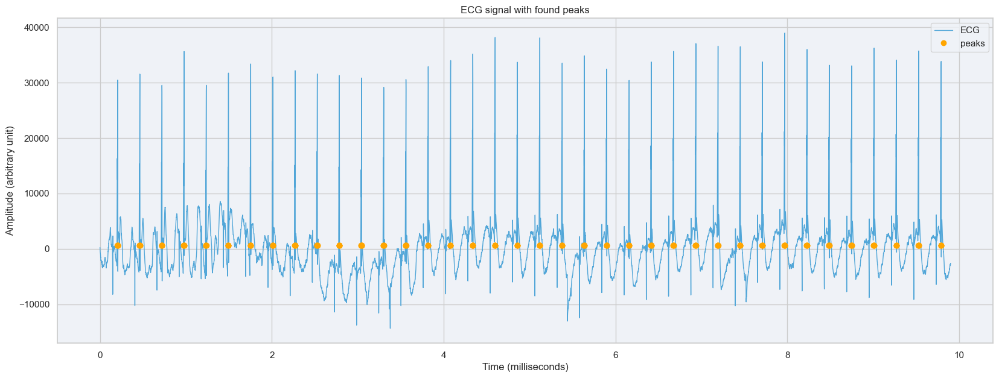

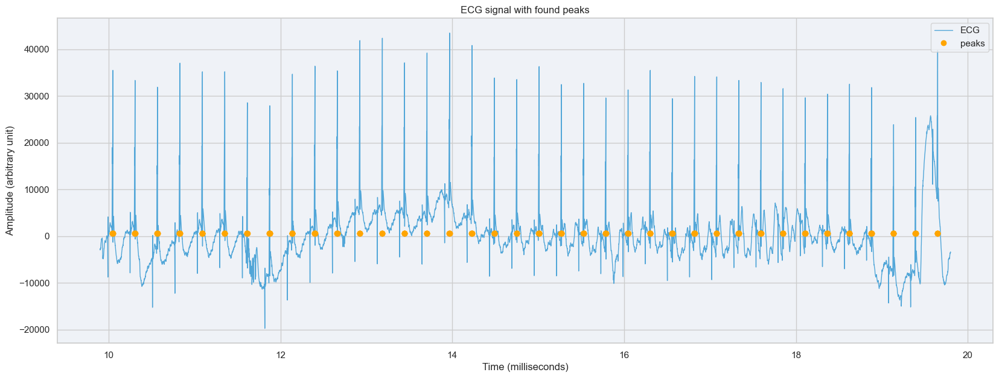

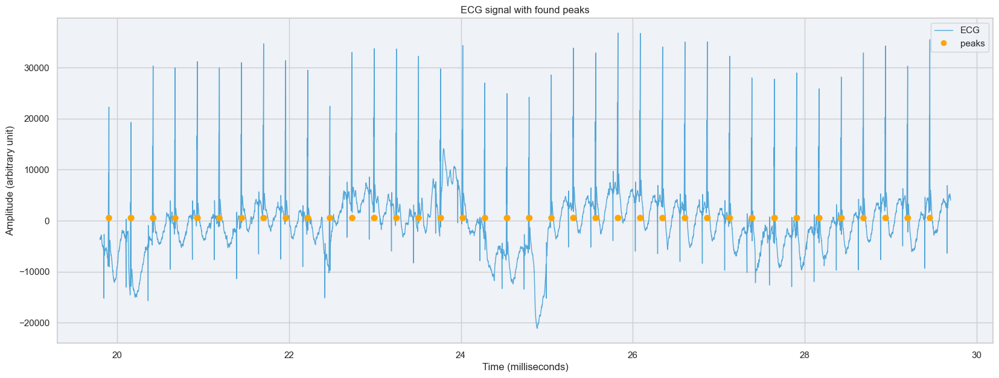

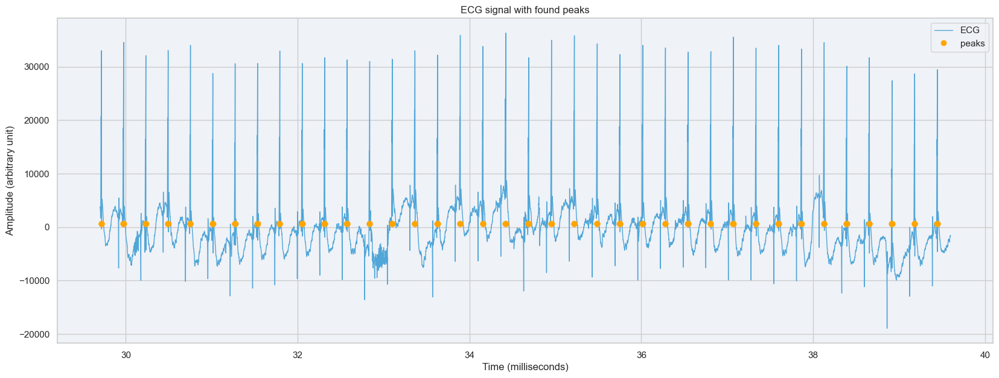

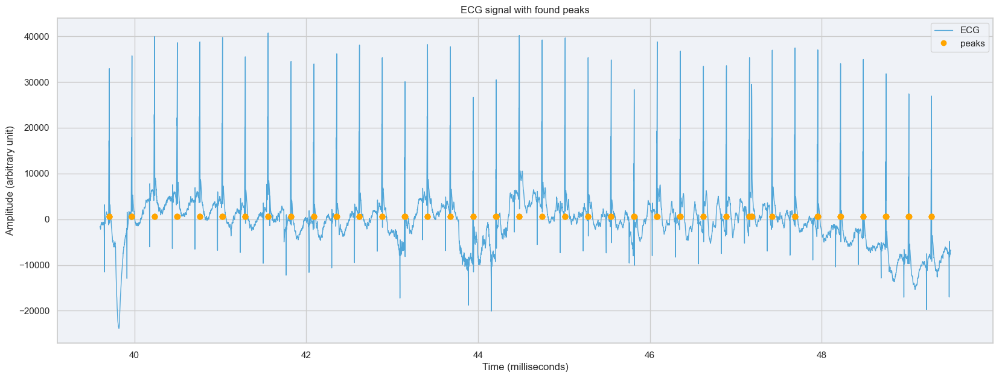

...

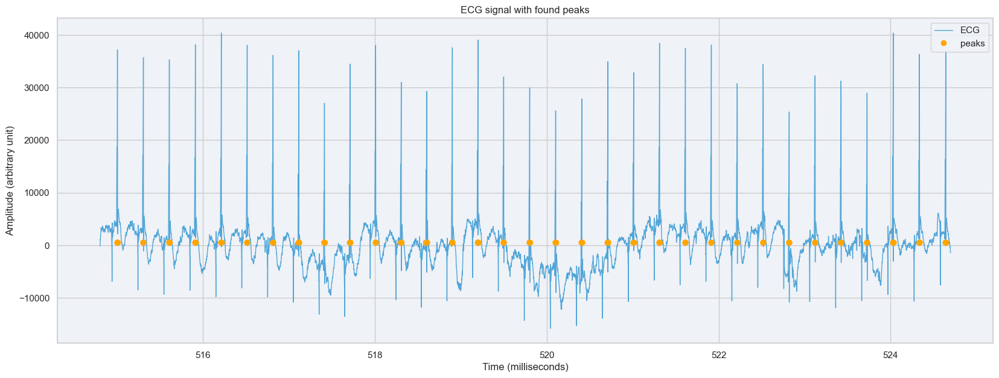

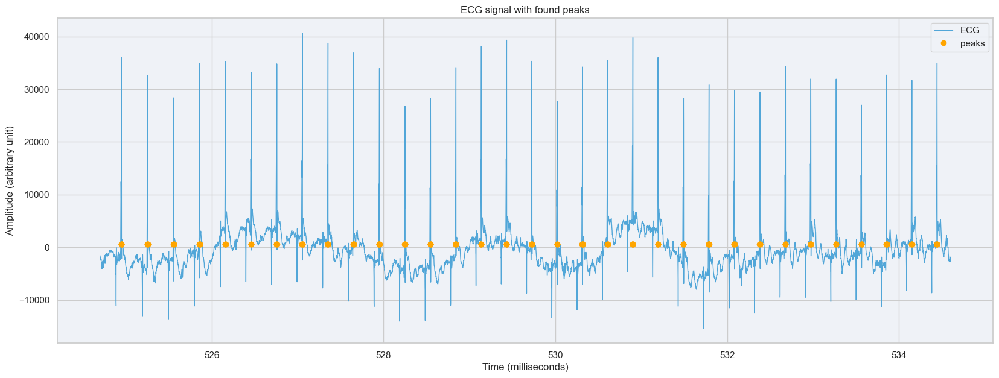

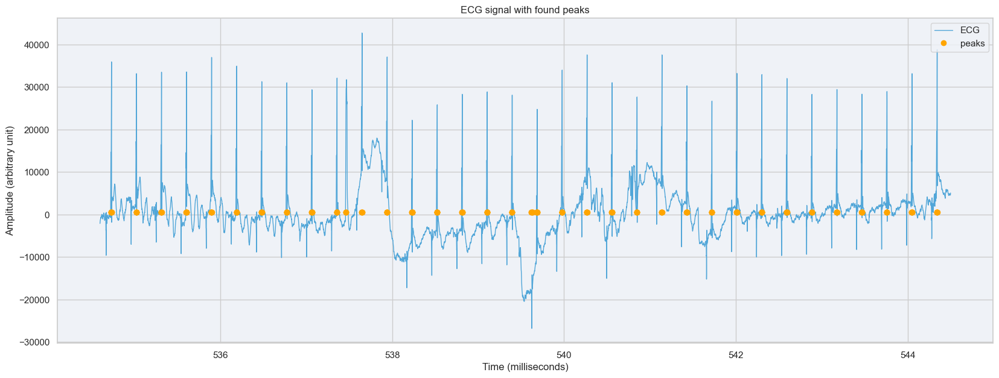

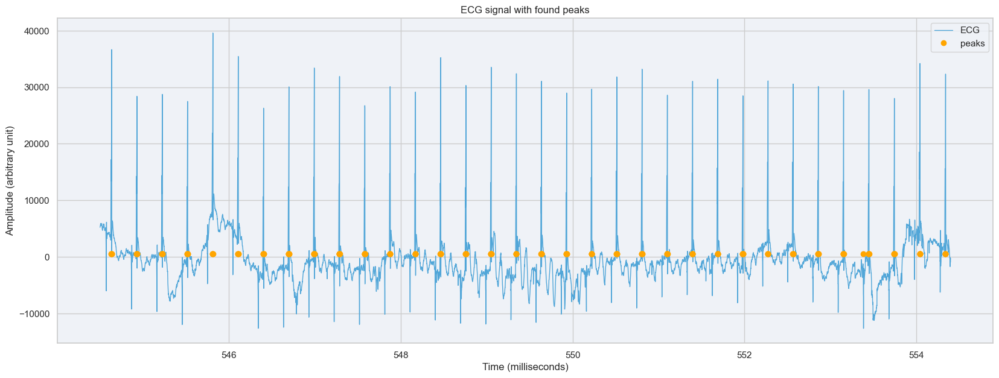

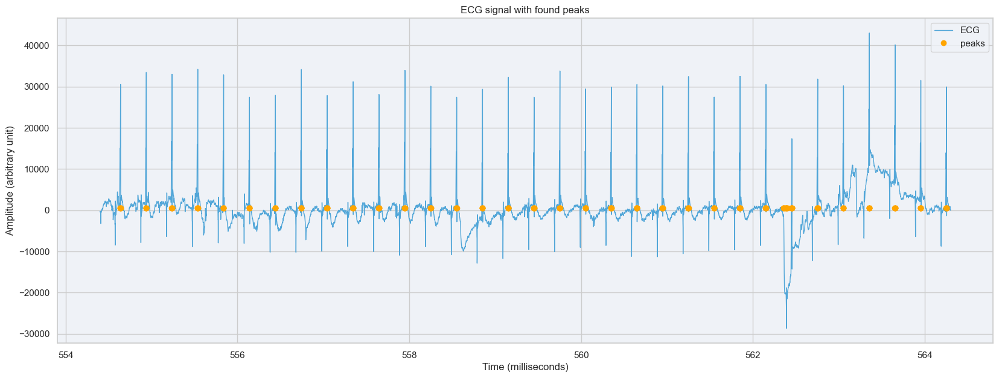

In [147]:
peaks = np.array([])

for start, stop in get_plot_ranges(0, data.shape[0] - 15000, n_intervals):
    ecg_slice = data.slice(start, stop - start)

    # detect peaks
    p, _ = detect_peaks(ecg_slice, threshold=0.4,
                        qrs_filter=None, col=selected_col_full)
    peaks = np.concatenate([peaks, p])

    # plot similarity
    plt.figure(figsize=(20, 7))

    plt.title("ECG signal with found peaks")
    plt.plot(ecg_slice["X"], ecg_slice[selected_col_full],
             label="ECG", color="#51A6D8", linewidth=1)
    plt.plot(p, np.repeat(600, p.shape[0]), label="peaks",
             color="orange", marker="o", linestyle="None")
    plt.legend(loc="upper right")
    plt.xlabel("Time (milliseconds)")
    plt.ylabel("Amplitude (arbitrary unit)")


In [148]:
# group peaks
grouped_peaks = group_peaks(np.array(peaks), 0.1)

# RR-intervals are the differences between successive peaks
rr = np.diff(grouped_peaks)


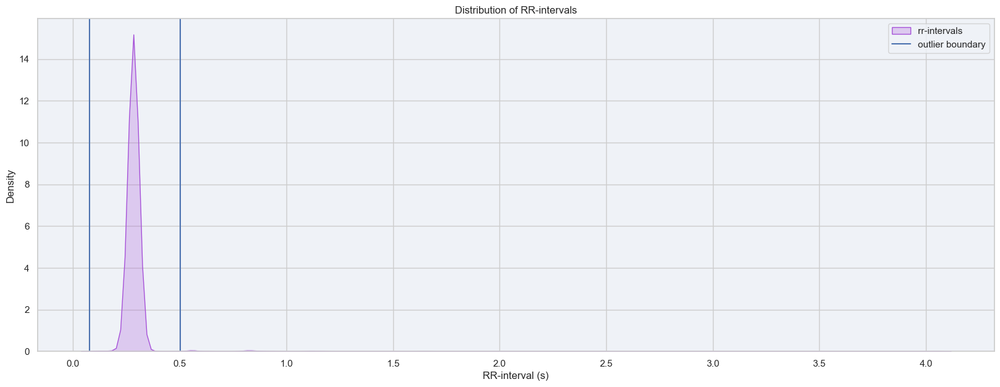

In [149]:
plt.figure(figsize=(20, 7))
plt.title("Distribution of RR-intervals")

with warnings.catch_warnings():
    warnings.simplefilter("ignore")  # ignore FutureWarning
    sns.kdeplot(rr, label="rr-intervals", color="#A651D8", shade=True)

outlier_low = np.mean(rr) - 2 * np.std(rr)
outlier_high = np.mean(rr) + 2 * np.std(rr)

plt.axvline(x=outlier_low)
plt.axvline(x=outlier_high, label="outlier boundary")
# plt.text(outlier_low - 370, 0.004, "outliers low (< mean - 2 sigma)")
# plt.text(outlier_high + 20, 0.004, "outliers high (> mean + 2 sigma)")

plt.xlabel("RR-interval (s)")
plt.ylabel("Density")

plt.legend()
plt.show()


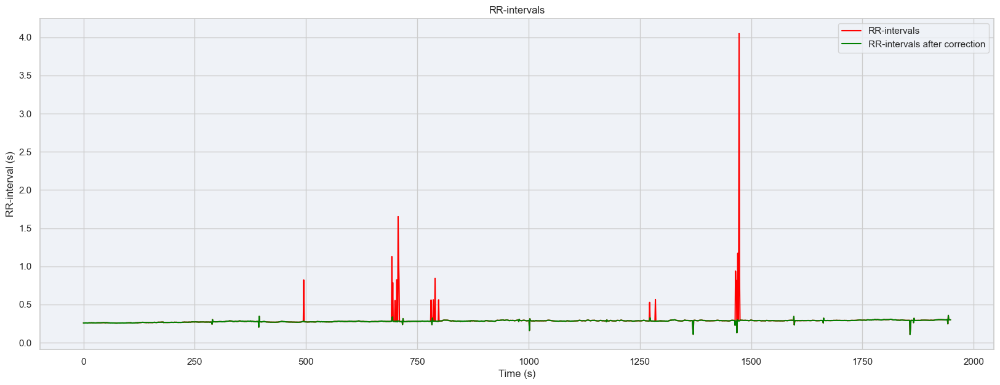

In [150]:
plt.figure(figsize=(20, 7))

rr_corrected = rr.copy()
rr_corrected[np.abs(zscore(rr)) > 2] = np.median(rr)

plt.title("RR-intervals")
plt.xlabel("Time (s)")
plt.ylabel("RR-interval (s)")

plt.plot(rr, color="red", label="RR-intervals")
plt.plot(rr_corrected, color="green",  label="RR-intervals after correction")
plt.legend()
plt.show()


Text(0, 0.5, 'RR-interval (s)')

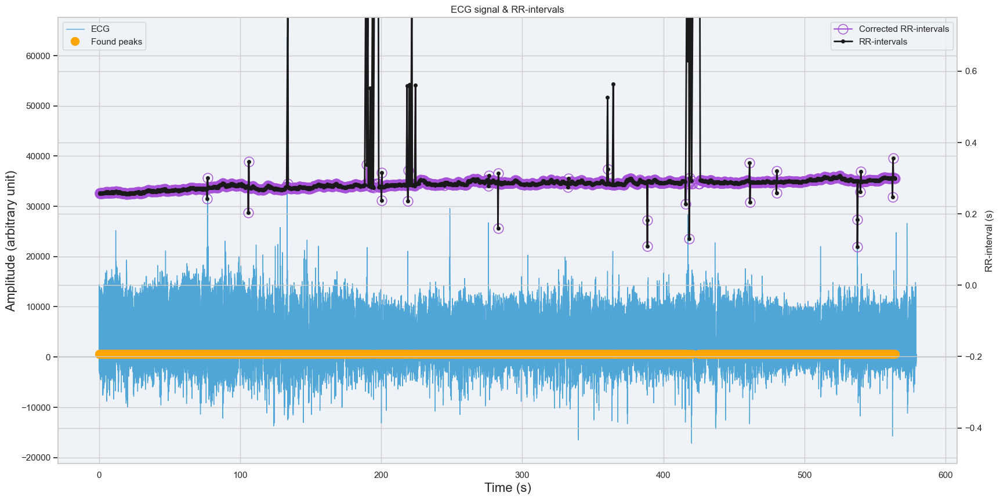

In [151]:
# plot similarity
plt.figure(figsize=(20, 10))

plt.title("ECG signal & RR-intervals")
plt.plot(filtered_df["X"], filtered_df[selected_col],
         label="ECG", color="#51A6D8", linewidth=1)
plt.plot(grouped_peaks, np.repeat(
    600, grouped_peaks.shape[0]), markersize=10, label="Found peaks", color="orange", marker="o", linestyle="None")
plt.legend(loc="upper left")
plt.xlabel("Time (s)", fontsize=16)
plt.ylabel("Amplitude (arbitrary unit)", fontsize=16)

ax2 = plt.gca().twinx()
ax2.plot(grouped_peaks[1:], rr_corrected, label="Corrected RR-intervals",
         fillstyle="none", color="#A651D8", markeredgewidth=1, marker="o", markersize=12)
ax2.plot(grouped_peaks[1:], rr, label="RR-intervals",
         color="k", linewidth=2, marker=".", markersize=8)

ax2.set_ylim(-0.5, 0.75)
ax2.legend(loc="upper right")
plt.xlabel("Time (s)")
plt.ylabel("RR-interval (s)")


# Скаттерограмма (Scatter plot)

Как уже было сказано ранее, скаттерограмма рассчитывается только по выделенной в области. Построим Scatter plot для первых 50 интервалов в норме и при аритмии. Для этого будем отображать данные на графике, проходя по массивам значений со всех электродов и выбирая для оси x с 1 по 51 элементы для k + 1 RR-интервалов, а для оси y выбирая с 0 по 50 элементы.

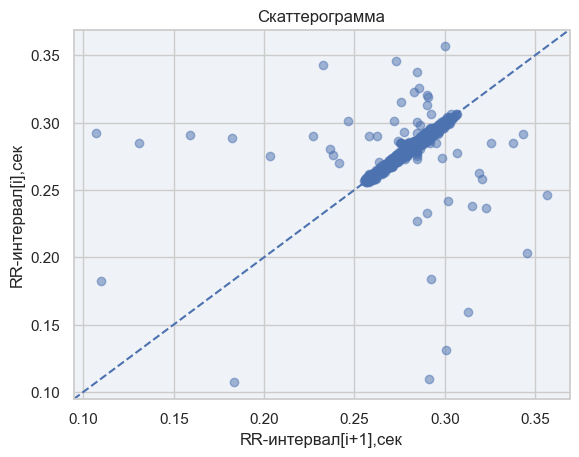

In [153]:
y = np.array(rr_corrected[0: -1])
x = np.array(rr_corrected[1:])
plt.scatter(x, y, alpha=0.5)

plt.axline((0.35, 0.35), slope=1, ls='--')
plt.title('Скаттерограмма')
plt.xlabel('RR-интервал[i+1],сек')
plt.ylabel('RR-интервал[i],сек')
plt.show()


# Хаосграмма (фазовый портрет)

Фазовые портреты ВРС являются основными объектами геометрического нелинейного анализа.


Существует несколько методик их построения. Согласно некоторым <b>по одной оси откладывается абсолютное значение кардиоинтервалов, по другой – прирост их скорости</b>.  Существует так же  прием фиксированной задержки, когда  точка фазового портрета соответствует  значению некоторой переменной  в заданный момент времени, взятой относительно значения той же переменной после фиксированной временной задержки.

На фазовых портретах ВРС мы получаем дополнительную новую информацию из-за накопления повторяющихся слабых ответов сердечнососудистой системы. Заранее спрогнозировать характер или вид, рисунок такой накопленной информации практически невозможно. Тем более, что в рисунке фазового портрета ВРС  учувствует  такой компонент физиологического процесса  как скорость.

Анализируя,  впоследствии,  фазовый портрет ВРС, мы сможем анализировать интегральные целостные процессы, базирующиеся на взаимодействиях между отдельными компонентами ВРС или же между этими компонентами и сопряженными изменениями в других органах и системах. Таким образом, мы получаем дополнительные знания о взаимодействиях колебательных процессов ВРС и их воздействии на другие системы.

Так как функция RR-интервалов у нас задана набором точек, производную будем находить по следующей формуле:
$$ f_i^{'} = {f_{i+1} - f_i \over x_{i+1} - x_i} $$

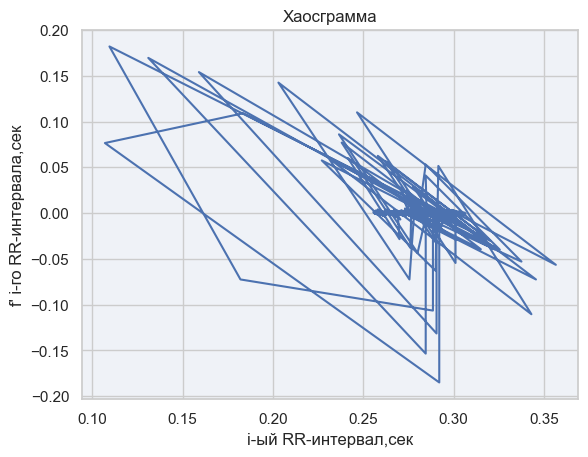

In [154]:
y = np.array(rr_corrected)
for idx, f in enumerate(y[:-1]):
    y[idx] = y[idx + 1] - f
y = y[:-1]
x = np.array(rr_corrected[0: -1])
plt.plot(x, y)

plt.title('Хаосграмма')
plt.xlabel('i-ый RR-интервал,сек')
plt.ylabel("f' i-го RR-интервала,сек")
plt.show()
